<a href="https://colab.research.google.com/github/manish-anandani/Data-Science-Projects/blob/main/Resume_Classification_Using_Naive_Bayes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Objectives

At the end of the mini-project, we will be able to :

* perform data preprocessing, EDA and feature extraction on the Resume dataset
* perform multinomial Naive Bayes classification on the Resume dataset

### Dataset description

The data is in CSV format, with two features: Category, and Resume.

**Category** -  Industry sector to which the resume belongs to, and

**Resume** - The complete CV (text) of the candidate.

## Information

Companies often receive thousands of resumes for each job posting and employ dedicated screening officers to screen qualified candidates. Finding suitable candidates for an open role from a database of 1000s of resumes can be a tough task. Automated resume categorization can speeden the candidate selection process. Such automation can really ease the tedious process of fair screening and shortlisting the right candidates and aid quick decisionmaking.

To learn more about this, click [here](https://www.sciencedirect.com/science/article/pii/S187705092030750X).

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.metrics import accuracy_score
from pandas.plotting import scatter_matrix
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer
from matplotlib.gridspec import GridSpec
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
import string
from wordcloud import WordCloud

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


#### Downloading the data

In [ ]:
#@title Download the dataset
!wget -qq https://cdn.iisc.talentsprint.com/CDS/Datasets/UpdatedResumeDataSet.csv
print("Data Downloaded Successfuly!!")

Data Downloaded Successfuly!!


In [ ]:
# read the dataset
df = pd.read_csv('UpdatedResumeDataSet.csv')
print(df.shape)
df.head(10)      # first 10 rows

(962, 2)


,Category,Resume
0,Data Science,Skills * Programming Languages: Python (pandas...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...
2,Data Science,"Areas of Interest Deep Learning, Control Syste..."
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab..."
5,Data Science,"SKILLS C Basics, IOT, Python, MATLAB, Data Sci..."
6,Data Science,Skills â¢ Python â¢ Tableau â¢ Data Visuali...
7,Data Science,Education Details \r\n B.Tech Rayat and Bahr...
8,Data Science,Personal Skills â¢ Ability to quickly grasp t...
9,Data Science,Expertise â Data and Quantitative Analysis â...


### Pre-processing and EDA

In [ ]:
# Display the distinct categories of resume
df['Category'].value_counts()

Java Developer               84
Testing                      70
DevOps Engineer              55
Python Developer             48
Web Designing                45
HR                           44
Hadoop                       42
Blockchain                   40
ETL Developer                40
Operations Manager           40
Data Science                 40
Sales                        40
Mechanical Engineer          40
Arts                         36
Database                     33
Electrical Engineering       30
Health and fitness           30
PMO                          30
Business Analyst             28
DotNet Developer             28
Automation Testing           26
Network Security Engineer    25
SAP Developer                24
Civil Engineer               24
Advocate                     20
Name: Category, dtype: int64

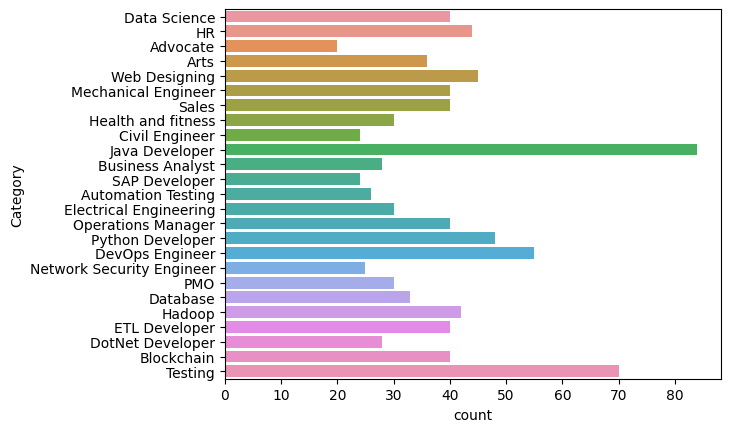

In [ ]:
# Create the count plot of different categories
import seaborn as sns
import matplotlib.pyplot as plt
#sns.countplot(data=df, x='Category')
sns.countplot(data=df, y='Category')
plt.show()


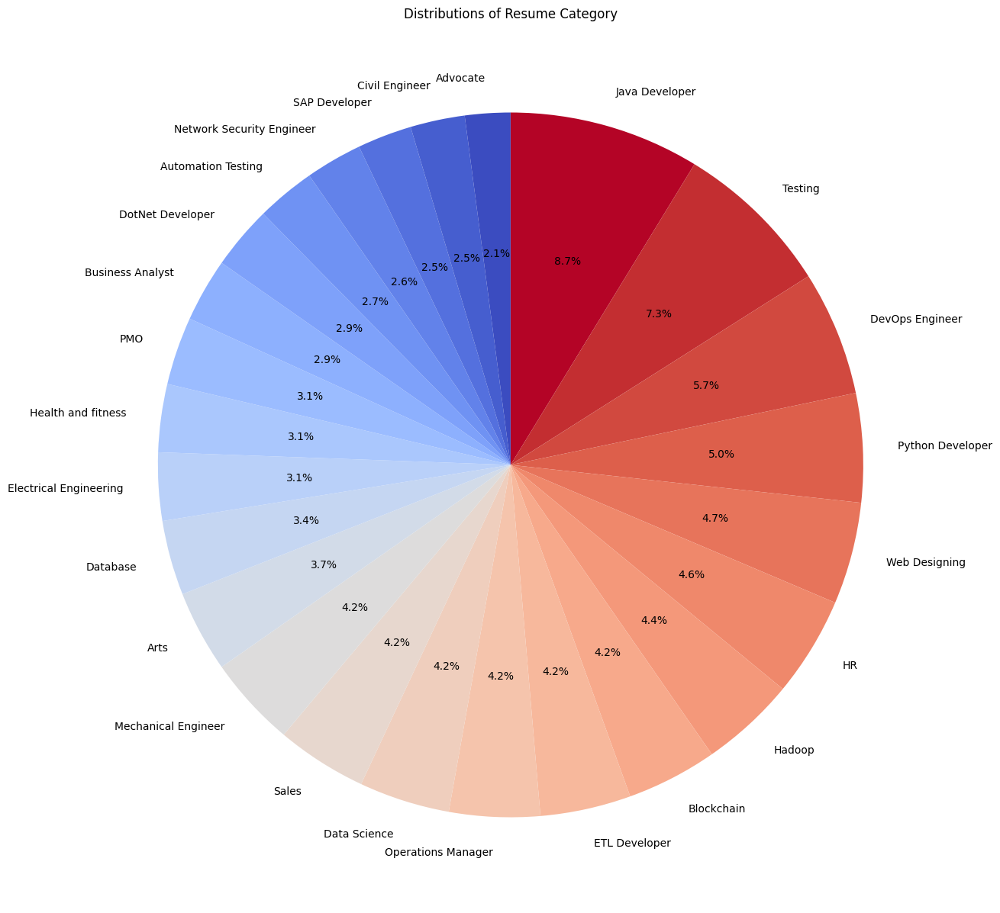

In [ ]:
# Create a pie plot depicting the percentage of resume distributions category-wise
Count_per_Category = df['Category'].value_counts()
Total_Resume = len(df)
Category_percentage = Count_per_Category / Total_Resume * 100
plt.figure(1, figsize=(15,15))
cmap = plt.get_cmap('coolwarm')
colors = cmap(np.linspace(0, 1, len(Count_per_Category)))

plt.pie(Category_percentage, labels=Category_percentage.index, autopct='%1.1f%%',startangle=90, colors=colors[::-1],counterclock=False)
plt.title('Distributions of Resume Category')
plt.show()

**Exercise 5: Convert all the `Resume` text to lower case [0.5 Mark]**




In [ ]:
# Convert all characters to lowercase
df['Resume'] = df['Resume'].apply(lambda x: x.lower())
df

,Category,Resume
0,Data Science,skills * programming languages: python (pandas...
1,Data Science,education details \r\nmay 2013 to may 2017 b.e...
2,Data Science,"areas of interest deep learning, control syste..."
3,Data Science,skills â¢ r â¢ python â¢ sap hana â¢ table...
4,Data Science,"education details \r\n mca ymcaust, faridab..."
...,...,...
957,Testing,computer skills: â¢ proficient in ms office (...
958,Testing,â willingness to accept the challenges. â ...
959,Testing,"personal skills â¢ quick learner, â¢ eagerne..."
960,Testing,computer skills & software knowledge ms-power ...


In the text there are special characters, urls, hashtags, mentions, etc. Remove the following:  

* URLs:
* RT | cc:
* Hashtags, # and Mentions, @
* punctuations
* extra whitespace

PS: Use the provided reference similarly for removing any other such elements.

After cleaning as above, store the Resume Text in a separate column (New Feature).


In [ ]:
import re
def cleanResume(resumeText):
  #remove the url
  url_re = re.compile(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+')
  resumeText = re.sub(url_re, '', resumeText)
  #remove hashtag
  hashtag_re = re.compile(r'#\w+')
  resumeText = re.sub(hashtag_re, '', resumeText)
  #remove
  mention_re = re.compile(r'@\w+')
  resumeText = re.sub(mention_re, '', resumeText)
  #remove special chars
  special_char_re = re.compile(r'[^a-zA-Z\s]')
  resumeText = re.sub(special_char_re, '', resumeText)
  #remove punctuations
  translation_table = str.maketrans("", "", string.punctuation)
  resumeText = resumeText.translate(translation_table)
  #remove white space chars like new \n \t \r
  resumeText = re.sub(r'\s', ' ', resumeText)
  #remove white space
  resumeText = resumeText.strip()
  return resumeText

In [ ]:
 # apply the function defined above and save the
df['cleaned_resume'] = df['Resume'].apply(cleanResume)
df.head()

,Category,Resume,cleaned_resume
0,Data Science,skills * programming languages: python (pandas...,skills programming languages python pandas nu...
1,Data Science,education details \r\nmay 2013 to may 2017 b.e...,education details may to may be uitrgpv ...
2,Data Science,"areas of interest deep learning, control syste...",areas of interest deep learning control system...
3,Data Science,skills â¢ r â¢ python â¢ sap hana â¢ table...,skills r python sap hana tableau sap hana...
4,Data Science,"education details \r\n mca ymcaust, faridab...",education details mca ymcaust faridabad ...


In [ ]:
sent_lens = []
for i in df.cleaned_resume:
    length = len(i.split())
    sent_lens.append(length)

print(len(sent_lens))
print(max(sent_lens))

962
1929


### Stopwords removal

The stopwords, for example, `and, the, was, and so forth` etc. appear very frequently in the text and are not helpful in the predictive process. Therefore these are usually removed for text analytics and text classification purposes.

1. Tokenize the input words into individual tokens and store it in an array
2. Using `nltk.corpus.stopwords`, remove the stopwords


In [ ]:
# find the most common words from the cleaned resume column
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist

fdist = FreqDist()
for resume in df['cleaned_resume']:
  for word in word_tokenize(resume):
    fdist[word] += 1

fdist

FreqDist({'and': 16680, 'the': 11485, 'of': 8777, 'to': 7598, 'in': 5523, 'for': 5255, 'exprience': 3829, 'with': 3804, 'company': 3526, 'project': 3361, ...})

In [ ]:
from nltk.tokenize import word_tokenize
# stop words
# print the stop words in english language
stopword_list = nltk.corpus.stopwords.words('english')


def remove_stopwords(text):
    # splitting strings into tokens
    tokens = word_tokenize(text)
    tokens = [token.strip() for token in tokens]
    filtered_tokens = [token for token in tokens if token not in stopword_list]
    filtered_text = ' '.join(filtered_tokens)
    filtered_text = filtered_text.strip()
    return filtered_text

In [ ]:
# apply function on review column
df['cleaned_resume'] = df['cleaned_resume'].apply(remove_stopwords)
df.head()

,Category,Resume,cleaned_resume
0,Data Science,skills * programming languages: python (pandas...,skills programming languages python pandas num...
1,Data Science,education details \r\nmay 2013 to may 2017 b.e...,education details may may uitrgpv data scienti...
2,Data Science,"areas of interest deep learning, control syste...",areas interest deep learning control system de...
3,Data Science,skills â¢ r â¢ python â¢ sap hana â¢ table...,skills r python sap hana tableau sap hana sql ...
4,Data Science,"education details \r\n mca ymcaust, faridab...",education details mca ymcaust faridabad haryan...


In [ ]:
# stemming the text
def simple_stemmer(text):
    ps=nltk.porter.PorterStemmer()
    text= ' '.join([ps.stem(word) for word in text.split()])
    return text
# apply function on review column
df['cleaned_resume'] = df['cleaned_resume'].apply(simple_stemmer)

from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

# lemmatizing the text
def simple_lemmatizer(text):
    lemmatizer = WordNetLemmatizer()
    text= ' '.join([lemmatizer.lemmatize(word) for word in text.split()])
    return text
# apply function on review column
df['cleaned_resume'] = df['cleaned_resume'].apply(simple_lemmatizer)

df

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,Category,Resume,cleaned_resume
0,Data Science,skills * programming languages: python (pandas...,skill program languag python panda numpi scipi...
1,Data Science,education details \r\nmay 2013 to may 2017 b.e...,educ detail may may uitrgpv data scientist dat...
2,Data Science,"areas of interest deep learning, control syste...",area interest deep learn control system design...
3,Data Science,skills â¢ r â¢ python â¢ sap hana â¢ table...,skill r python sap hana tableau sap hana sql s...
4,Data Science,"education details \r\n mca ymcaust, faridab...",educ detail mca ymcaust faridabad haryana data...
...,...,...,...
957,Testing,computer skills: â¢ proficient in ms office (...,comput skill profici m offic word basic excel ...
958,Testing,â willingness to accept the challenges. â ...,willing accept challeng posit think good learn...
959,Testing,"personal skills â¢ quick learner, â¢ eagerne...",person skill quick learner eager learn new thi...
960,Testing,computer skills & software knowledge ms-power ...,comput skill softwar knowledg mspower point m ...


In [ ]:
# find the most common words from the cleaned resume column
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist

fdist = FreqDist()
for resume in df['cleaned_resume']:
  for word in word_tokenize(resume):
    fdist[word] += 1

fdist

FreqDist({'project': 3939, 'exprienc': 3829, 'compani': 3635, 'manag': 3596, 'develop': 3497, 'month': 3339, 'detail': 3237, 'descript': 3130, 'test': 2656, 'work': 2387, ...})

In [ ]:
# most common words - visualization
def plt_word_cloud(data,title=''):
  plt.figure(figsize=(10,10))
  word_text = ' '.join(text for text in data)
  WC = WordCloud(width=1000, height=500, max_words=500, min_font_size=5)
  text_words = WC.generate(word_text)
  plt.title(title, fontweight ="bold")
  plt.imshow(text_words, interpolation='bilinear')
  plt.show

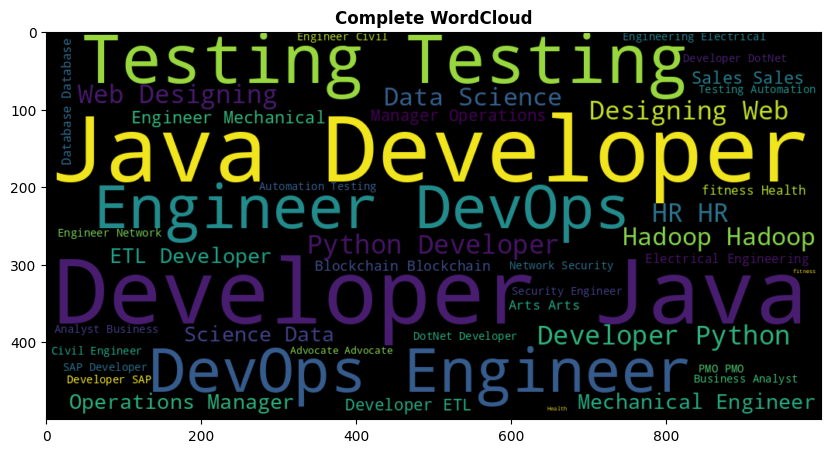

In [ ]:
plt_word_cloud(df['Category'],title='Complete WordCloud')

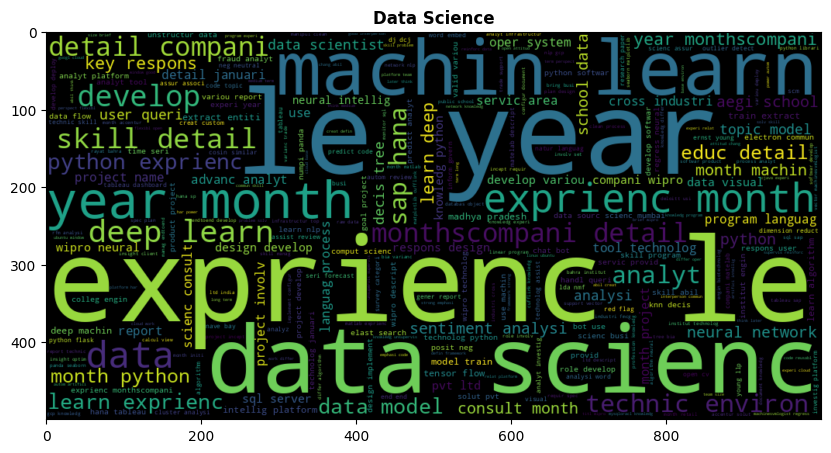

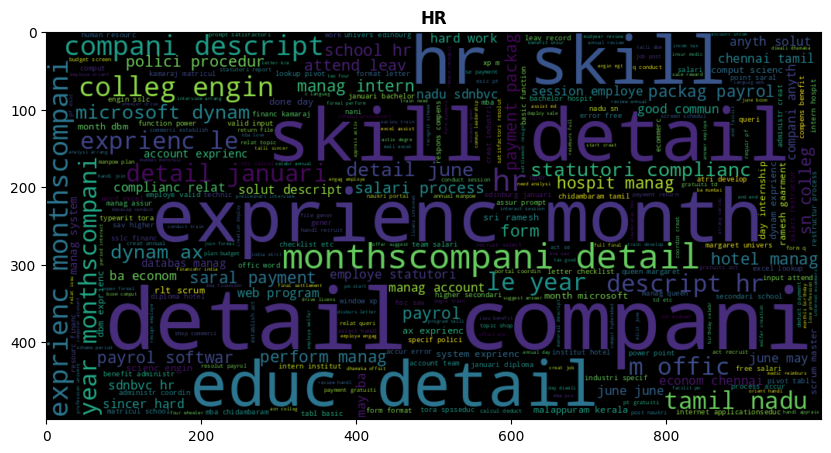

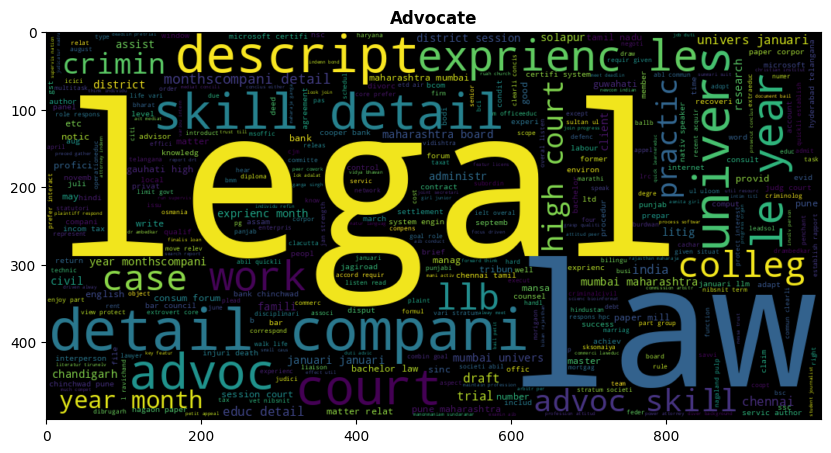

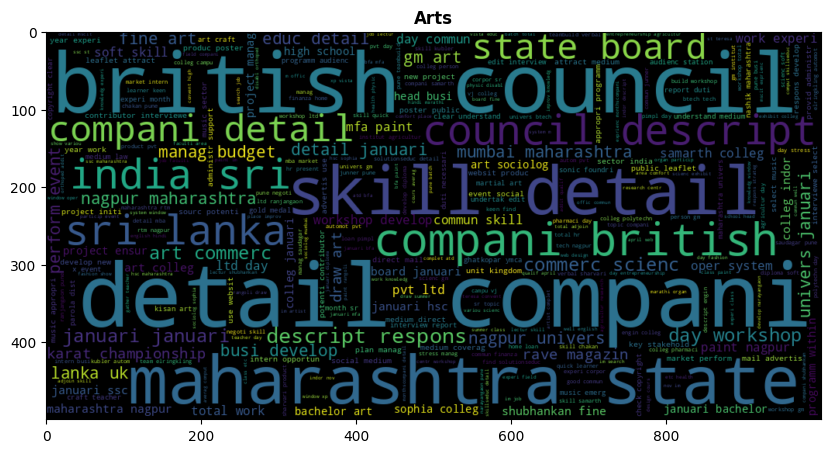

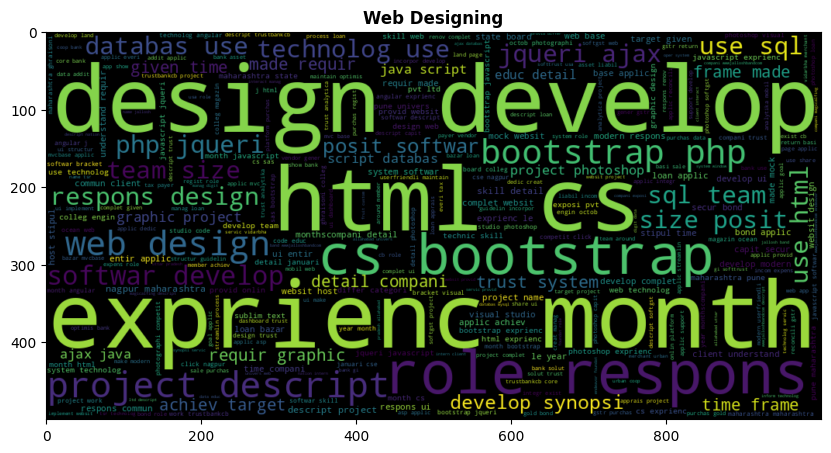

...

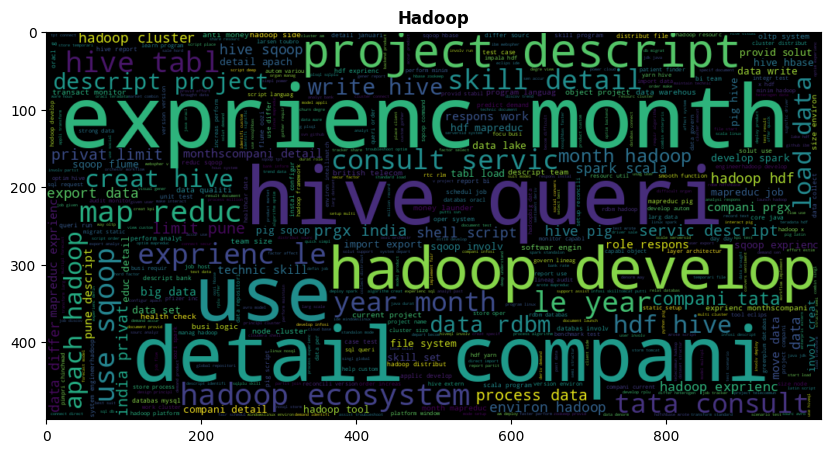

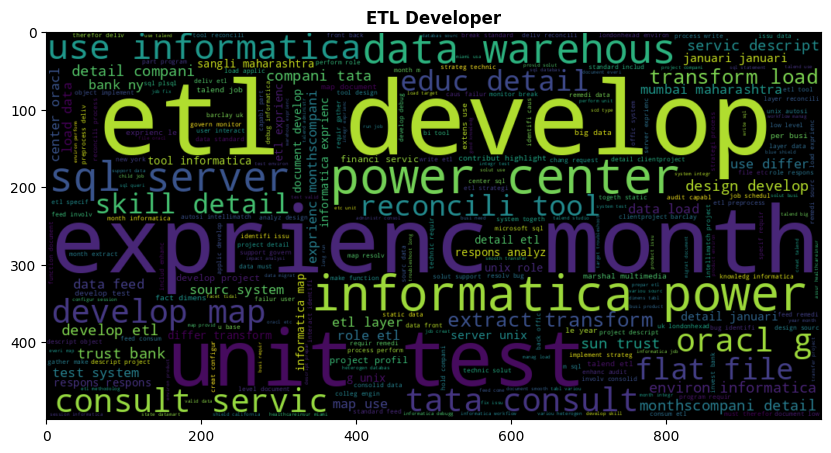

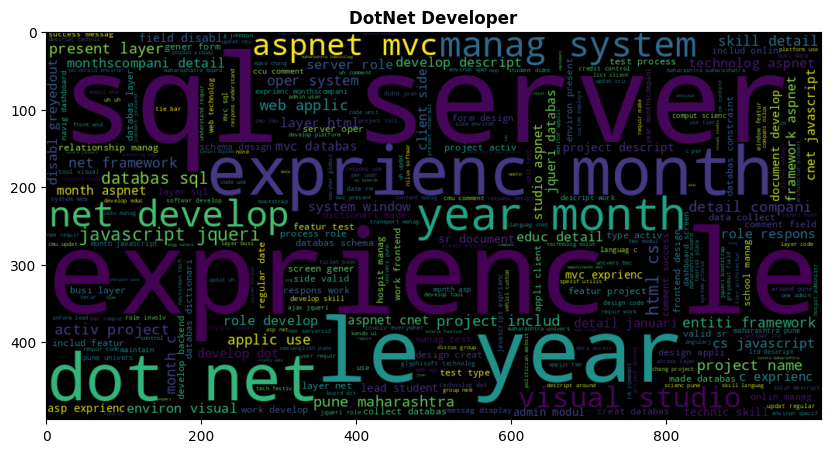

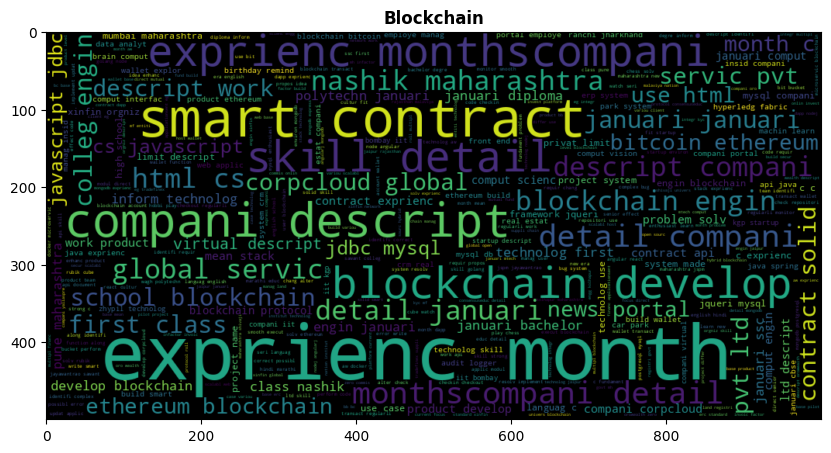

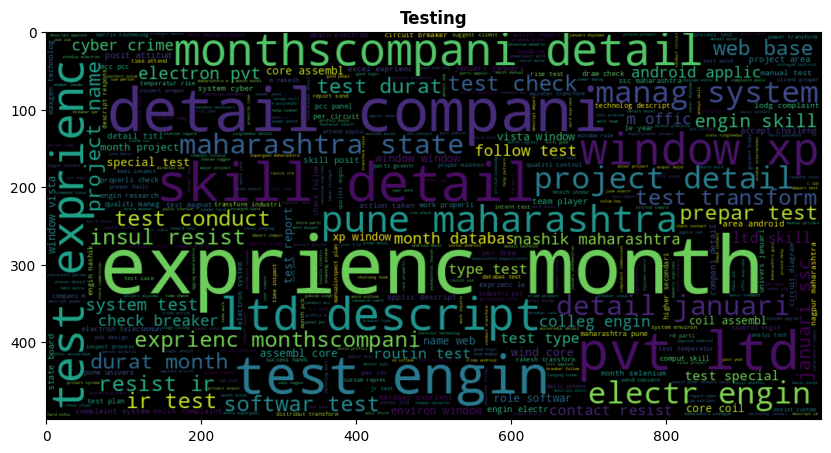

In [ ]:
# YOUR CODE HERE to show the most common word using WordCloud
for cat in df['Category'].unique():
  plt_word_cloud(df[df['Category']==cat]['cleaned_resume'],title=cat)

In [ ]:
# Convert the categorical variable Category to a numerical feature and make a different column, which can be treated as the target variable
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
le.fit(df['Category'].unique())
df['Label_Category'] = le.transform(df['Category'])
df
# YOUR CODE HERE

,Category,Resume,cleaned_resume,Label_Category
0,Data Science,skills * programming languages: python (pandas...,skill program languag python panda numpi scipi...,6
1,Data Science,education details \r\nmay 2013 to may 2017 b.e...,educ detail may may uitrgpv data scientist dat...,6
2,Data Science,"areas of interest deep learning, control syste...",area interest deep learn control system design...,6
3,Data Science,skills â¢ r â¢ python â¢ sap hana â¢ table...,skill r python sap hana tableau sap hana sql s...,6
4,Data Science,"education details \r\n mca ymcaust, faridab...",educ detail mca ymcaust faridabad haryana data...,6
...,...,...,...,...
957,Testing,computer skills: â¢ proficient in ms office (...,comput skill profici m offic word basic excel ...,23
958,Testing,â willingness to accept the challenges. â ...,willing accept challeng posit think good learn...,23
959,Testing,"personal skills â¢ quick learner, â¢ eagerne...",person skill quick learner eager learn new thi...,23
960,Testing,computer skills & software knowledge ms-power ...,comput skill softwar knowledg mspower point m ...,23


In [ ]:
# Segregate training and testing data
X_train, X_test, y_train, y_test = train_test_split(df.cleaned_resume, df.Label_Category, test_size = 0.2)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


(769,)
(193,)
(769,)
(193,)


### Feature Extraction

In [ ]:
# Convert the text to feature vectors by applying tfidf vectorizer to the Label encoded category
# tfidf vectorizer will tokenize documents, learn the vocabulary, inverse document frequency weightings, and allow you to encode new documents
tvx = TfidfVectorizer( use_idf=True, ngram_range = (1,3))

#transformed train reviews
tfidf_train_resume = tvx.fit_transform(X_train)
#transformed test reviews
tfidf_test_resume = tvx.transform(X_test)

print('Tfidf_train:', tfidf_train_resume.shape)
print('Tfidf_test:', tfidf_test_resume.shape)

Tfidf_train: (769, 75706)
Tfidf_test: (193, 75706)


## Naive Bayes Classifier

In [ ]:
# training the model
mnb=MultinomialNB()
# fitting the NaiveBayes for tfidf features
mnb_tfidf = mnb.fit(tfidf_train_resume, y_train)
print('MultinomialNB for tf-idf :',mnb_tfidf)

MultinomialNB for tf-idf : MultinomialNB()


In [ ]:
# predicting the model for tfidf features
mnb_tfidf_predict = mnb.predict(tfidf_test_resume)
print('predictions for tf-idf :', mnb_tfidf_predict)
print(y_test.values)

predictions for tf-idf : [ 6 16 12 13 16 22 15 14  3  3 18  2  8  8 22 14  4  1  9  5 16 23 20 23
  8 24  9 22 12 11 10 19 15 23 18 12 15 13 18 19  1 23  7  2 11 20 17 21
  5 21 20 19 11 21 12  9  2 23 15  1 17 12 18 23  3 22 15 18 16 20 15  6
  2 23 14 22 15  1  8  5 15 12 16 12 21 24  4 21  6 11 19  6 17 15 24  6
  5 12 24  8 13 15 23 10 19 18 11  1 15 20 24 23  3 22 22  3 16  9  4  7
 16  8 10  3 22 20  8 13  8 23 10 12  3  5 21 15 13 15 18 24 22 16 13  8
 14 11 14 14 19 24  3  6 18 22 20  5  9  2 22 24 10  9 12 23 18 22 24 11
  3  4 17 18  1 13 15 16 23 13 15  1  8 19 23 15 17 12 22  3 23 15 14  7
 23]
[ 6 16 12 13 16 22  0 14  3  3 18  2  8  8 22 14  4  1  9  5 16 23 20  8
  8 24  9 22 12 11 10 19 15 23  8 12  2 13 18 19  1 23  7  2 11 20 17 21
  5 21 20 19 11 21 12  9  2 23 15  1 17 12 18 23  3 22  0 18 16 20  0  6
  2 23 14 22  0  1  8  5 15 12 16 12 21 24  4 21  6 11 19  6 17 15 24  6
  5 12 24  8 13 15 23 10 19 18 11  1 15 20 24 23  3 22 22  3 16  9  4  7
 16  8 10  3 22 20  8

In [ ]:
# accuracy score for tf-idf
mnb_tfidf_score = accuracy_score(y_test, mnb_tfidf_predict)
print("mnb_tfidf_score :", mnb_tfidf_score)

mnb_tfidf_score : 0.9533678756476683


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
report = classification_report(y_test, mnb_tfidf_predict)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       1.00      1.00      1.00         7
           2       1.00      0.71      0.83         7
           3       1.00      1.00      1.00        10
           4       1.00      1.00      1.00         4
           5       1.00      1.00      1.00         6
           6       1.00      1.00      1.00         6
           7       1.00      1.00      1.00         3
           8       1.00      0.83      0.91        12
           9       1.00      1.00      1.00         6
          10       1.00      1.00      1.00         5
          11       1.00      1.00      1.00         7
          12       1.00      1.00      1.00        11
          13       1.00      1.00      1.00         8
          14       1.00      1.00      1.00         7
          15       0.65      1.00      0.79        11
          16       1.00      1.00      1.00         9
    

Dataset Source Reference: [Resume dataset](https://www.kaggle.com/gauravduttakiit/resume-dataset/download)